## Setup

In [1]:
# !pip install tensorflow-gpu==2.8.0
# !pip install tensorflow-datasets

In [2]:
import tensorflow as tf
print(tf.__version__)

2024-10-24 22:48:44.788597: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcudart.so.11.0'; dlerror: libcudart.so.11.0: cannot open shared object file: No such file or directory
2024-10-24 22:48:44.788611: I tensorflow/stream_executor/cuda/cudart_stub.cc:29] Ignore above cudart dlerror if you do not have a GPU set up on your machine.


2.8.0


In [3]:
import matplotlib.pyplot as plt
import numpy as np

In [4]:
# Other imports
from tensorflow.keras.layers import *
from tensorflow.keras.models import *

import tensorflow_datasets as tfds
tfds.disable_progress_bar()

import matplotlib.pyplot as plt
import numpy as np
import random
import shutil
import time
import cv2
import os

# Fix the seeds
SEED = 666
tf.random.set_seed(SEED)
np.random.seed(SEED)

## Utils

In [5]:
# Image preprocessing utils, Function to preprocess an image for performing inference

SIZE = (224, 224)

def preprocess_image(image, label):
    # The model includes the normalization steps
    image = tf.image.resize(image, SIZE)
    return (image, label)

# Data collection

We first load a sample image dataset (flowers) which we will perturb in order to fool our pre-trained image classifier. We also specify a list that contains the dataset class labels.

In [7]:
import tensorflow_datasets as tfds
tfds.disable_progress_bar()

# Gather Flowers dataset
train_ds, validation_ds = tfds.load(
    "tf_flowers",
    split=["train[:85%]", "train[85%:]"],
    as_supervised=True
)

# Specify the class labels, we would need this to create targeted attacks
CLASSES = ["daisy", "dandelion", "roses", "sunflowers", "tulips"]

2024-10-24 22:49:22.027442: W tensorflow/core/kernels/data/cache_dataset_ops.cc:768] The calling iterator did not fully read the dataset being cached. In order to avoid unexpected truncation of the dataset, the partially cached contents of the dataset  will be discarded. This can happen if you have an input pipeline similar to `dataset.cache().take(k).repeat()`. You should use `dataset.take(k).cache().repeat()` instead.


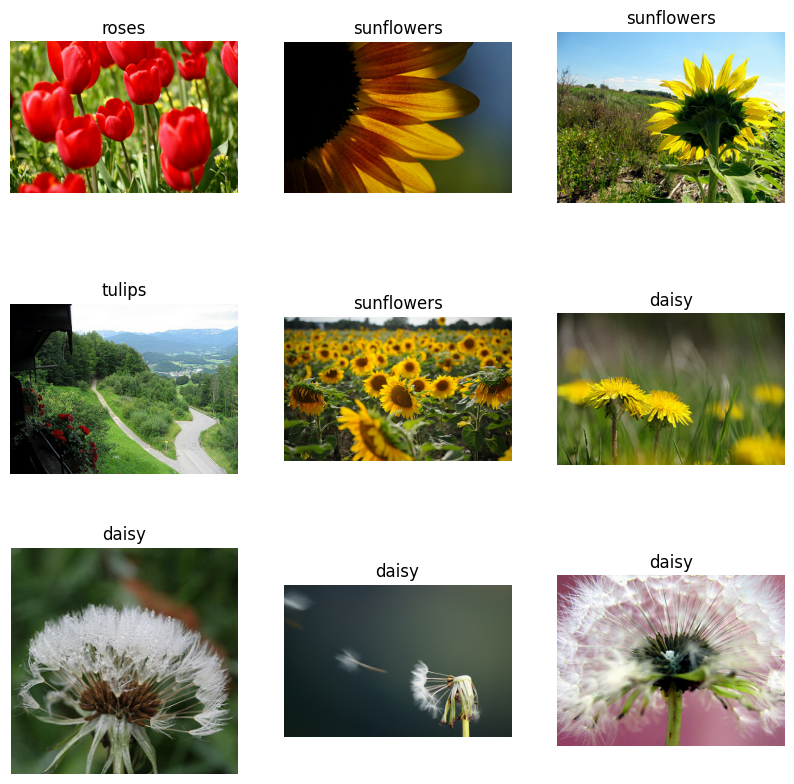

In [8]:
# Visualization
plt.figure(figsize=(10, 10))
for i, (image, label) in enumerate(train_ds.take(9)):
    ax = plt.subplot(3, 3, i + 1)
    plt.imshow(image)
    plt.title(CLASSES[int(label)])
    plt.axis("off")

# Data preparation

In [9]:
# Construct TensorFlow dataset
BATCH_SIZE = 64
AUTO = tf.data.experimental.AUTOTUNE

train_ds = (
    train_ds
    .map(preprocess_image, num_parallel_calls=AUTO)
    .cache()
    .shuffle(1024)
    .batch(BATCH_SIZE)
    .prefetch(buffer_size=tf.data.experimental.AUTOTUNE)
)

validation_ds = (
    validation_ds
    .map(preprocess_image, num_parallel_calls=AUTO)
    .cache()
    .batch(BATCH_SIZE)
    .prefetch(buffer_size=tf.data.experimental.AUTOTUNE)
)

# Model utils

In [10]:
# Reference: https://keras.io/examples/vision/image_classification_efficientnet_fine_tuning/
def get_training_model(base_model):
    inputs = Input(shape=(224, 224, 3))
    x = base_model(inputs, training=False)
    x = GlobalAveragePooling2D()(x)
    x = BatchNormalization()(x)

    top_dropout_rate = 0.2
    x = Dropout(top_dropout_rate)(x)
    x = Dense(5, activation="softmax")(x)
    classifier = Model(inputs=inputs, outputs=x)
    
    return classifier

def plot_progress(hist):
    plt.plot(hist.history["loss"], label="train_loss")
    plt.plot(hist.history["val_loss"], label="validation_loss")
    plt.plot(hist.history["accuracy"], label="training_accuracy")
    plt.plot(hist.history["val_accuracy"], label="validation_accuracy")
    plt.title("Training Progress")
    plt.ylabel("accuracy/loss")
    plt.xlabel("epoch")
    plt.legend(loc="upper left")
    plt.show()

# Load pretrained model

In [11]:
# Load the ResNet50 model but exclude the classification layers
resnet50 = tf.keras.applications.ResNet50(weights="imagenet", include_top=False)
resnet50.trainable = False
get_training_model(resnet50).summary()

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_3 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 resnet50 (Functional)       (None, None, None, 2048)  23587712  
                                                                 
 global_average_pooling2d (G  (None, 2048)             0         
 lobalAveragePooling2D)                                          
                                                                 
 batch_normalization (BatchN  (None, 2048)             8192      
 ormalization)                                                   
                                                                 
 dropout (Dropout)           (None, 2048)              0         
                                                                 
 dense (Dense)               (None, 5)                 10245 

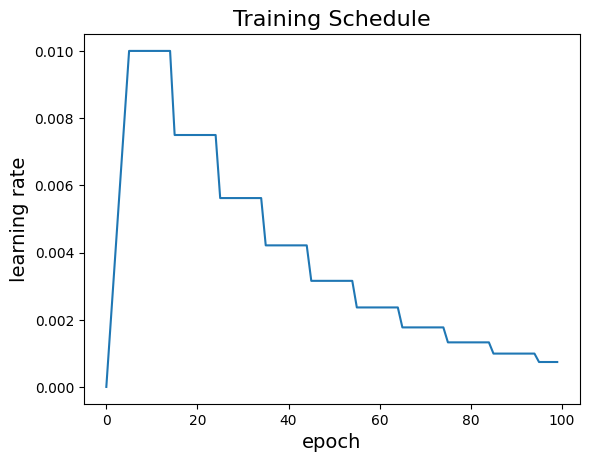

In [12]:
# CUSTOM LEARNING SCHEUDLE
# Reference: https://www.kaggle.com/cdeotte/how-to-compete-with-gpus-workshop
LR_START = 1e-5
LR_MAX = 1e-2
LR_RAMPUP_EPOCHS = 5
LR_SUSTAIN_EPOCHS = 0
LR_STEP_DECAY = 0.75

def lrfn(epoch):
    if epoch < LR_RAMPUP_EPOCHS:
        lr = (LR_MAX - LR_START) / LR_RAMPUP_EPOCHS * epoch + LR_START
    elif epoch < LR_RAMPUP_EPOCHS + LR_SUSTAIN_EPOCHS:
        lr = LR_MAX
    else:
        lr = LR_MAX * LR_STEP_DECAY**((epoch - LR_RAMPUP_EPOCHS - LR_SUSTAIN_EPOCHS)//10)
    return lr
    
lr2 = tf.keras.callbacks.LearningRateScheduler(lrfn, verbose=True)

rng = [i for i in range(100)]
y = [lrfn(x) for x in rng]
plt.plot(rng, y); 
plt.xlabel('epoch',size=14); plt.ylabel('learning rate',size=14)
plt.title('Training Schedule',size=16); plt.show()

In [13]:
# Early stopping callback
es = tf.keras.callbacks.EarlyStopping(
    monitor="val_loss", patience=5, restore_best_weights=True
)


Epoch 1: LearningRateScheduler setting learning rate to 1e-05.
Epoch 1/30
49/49 [==============================] - 51s 1s/step - loss: 2.5758 - accuracy: 0.1785 - val_loss: 2.0180 - val_accuracy: 0.1855 - lr: 1.0000e-05

Epoch 2: LearningRateScheduler setting learning rate to 0.0020080000000000002.
Epoch 2/30
49/49 [==============================] - 49s 1s/step - loss: 0.7528 - accuracy: 0.7615 - val_loss: 0.4465 - val_accuracy: 0.8345 - lr: 0.0020

Epoch 3: LearningRateScheduler setting learning rate to 0.004006.
Epoch 3/30
49/49 [==============================] - 49s 1s/step - loss: 0.3710 - accuracy: 0.8708 - val_loss: 0.3949 - val_accuracy: 0.8527 - lr: 0.0040

Epoch 4: LearningRateScheduler setting learning rate to 0.006004000000000001.
Epoch 4/30
49/49 [==============================] - 49s 1s/step - loss: 0.2794 - accuracy: 0.9054 - val_loss: 0.3589 - val_accuracy: 0.8818 - lr: 0.0060

Epoch 5: LearningRateScheduler setting learning rate to 0.008002.
Epoch 5/30
49/49 [=========

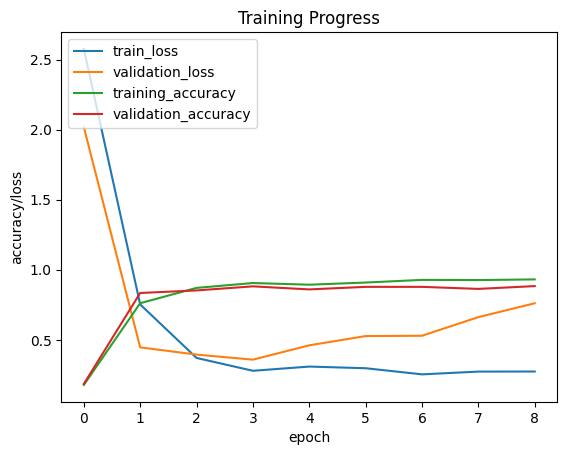

In [14]:
# Train the model
resnet50_flowers = get_training_model(resnet50)
resnet50_flowers.compile(loss="sparse_categorical_crossentropy", optimizer="adam", metrics=["accuracy"])
start = time.time()
h = resnet50_flowers.fit(train_ds,
              validation_data=validation_ds,
              epochs=30,
              callbacks=[lr2, es])
print("Total training time (seconds): ",time.time()-start)
plot_progress(h)

# Plotting sample predictions

In [15]:
# Utility to plot sample predictions 
def plot_predictions(images, labels, probability):
    plt.figure(figsize=(15, 15))
    for i, image in enumerate(images):
        ax = plt.subplot(4, 4, i + 1)
        plt.imshow(image.numpy().astype("uint8"))
        predicted_label = CLASSES[np.argmax(probability[i])]
        maximum_probability = "{:.3f}".format(max(probability[i]))
        text = "{} with probability: {}".format(predicted_label, maximum_probability) + \
            "\nGround-truth: {}".format(CLASSES[int(labels[i])])
        plt.title(text)
        plt.axis("off")
    plt.show()

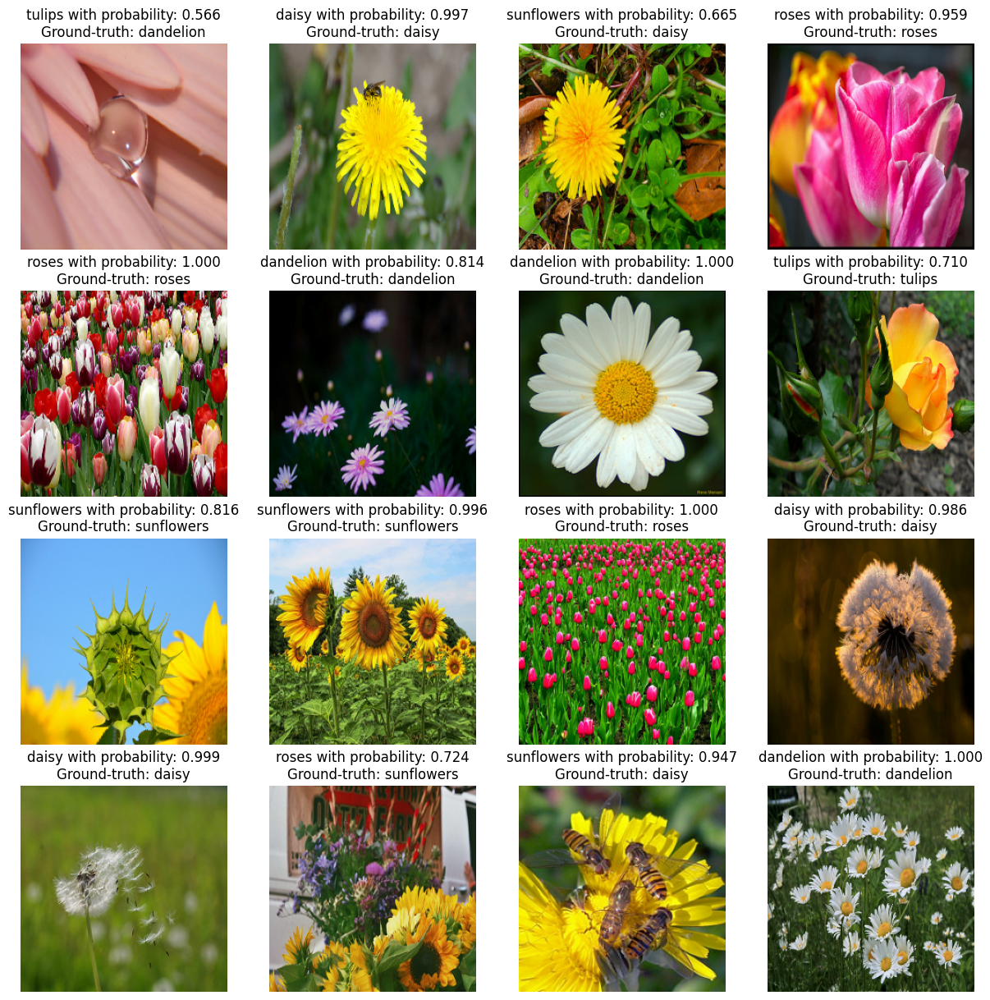

In [16]:
# Let's run inference on a batch of images from the validation set
(batch_images, batch_labels) = next(iter(validation_ds))

predictions = resnet50_flowers.predict(batch_images)
plot_predictions(batch_images[:16], batch_labels[:16], predictions[:16])

## Utilities for creating a targeted adversarial example by PGD attacks

In [17]:
#@title - # Clipping utility so that the pixel values stay within [0,1]
EPS = 2./255

def clip_eps(delta_tensor):
    return tf.clip_by_value(delta_tensor, clip_value_min=-EPS, clip_value_max=EPS)

In [18]:
#@title
def generate_adversaries_targeted(model, image_tensor, delta, 
    true_index, target_index):
    # Loss and optimizer
    scc_loss = tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True)
    optimizer = tf.keras.optimizers.Adam(learning_rate=5e-3)

    for t in range(350):
        plt.show()
        with tf.GradientTape() as tape:
            tape.watch(delta)
            inp = (image_tensor + delta)
            predictions = model(inp, training=False)
            loss = (- scc_loss(tf.convert_to_tensor([true_index]), predictions) + 
	                    scc_loss(tf.convert_to_tensor([target_index]), predictions))
            if t % 20 == 0:
                print(t, loss.numpy())
                plt.imshow(50*delta.numpy().squeeze()+0.5)
            
        # Get the gradients
        gradients = tape.gradient(loss, delta)
        
        # Update the weights
        optimizer.apply_gradients([(gradients, delta)])

        # Project the delta back (l-infinite norm)
        delta.assign_add(clip_eps(delta))

    return delta

In [19]:
#@title
def perturb_image(model, image, true, target):
    print("Before adversarial attack")
    # preprocessed_image = image/255.
    probabilities = model.predict(image)
    class_index = np.argmax(probabilities)
    print("Ground-truth label: {} predicted label: {}".format(CLASSES[true], CLASSES[class_index]))
    
    # Initialize the perturbation quantity
    image_tensor = tf.constant(image, dtype=tf.float32)
    delta = tf.Variable(tf.zeros_like(image_tensor), trainable=True)

    # Get the adversary vector
    delta_tensor = generate_adversaries_targeted(model, image_tensor, delta, true, target)

    # See if the image changes
    plt.imshow((image_tensor + delta_tensor).numpy().astype("uint8").squeeze())
    plt.show()

    # Generate prediction
    perturbed_image = (image_tensor + delta_tensor)
    print("After adversarial attack")
    
    # Generate predictions
    preds = model.predict(perturbed_image)[0]
    i = np.argmax(preds)
    pred_label = CLASSES[i]

    print("Predicted label: {}".format(pred_label))
    cv2.imwrite("perturbed_image.png", perturbed_image.numpy().squeeze())

In [20]:
# Pick an image from the validation set
index = 15
sample_val_image = (batch_images[index])
sample_val_image = np.expand_dims(sample_val_image, 0)

Before adversarial attack
Ground-truth label: dandelion predicted label: dandelion
0 12.16588


/home/quynhnl/miniforge3/envs/fas/lib/python3.10/site-packages/tensorflow/python/util/dispatch.py:1082: UserWarning: "`sparse_categorical_crossentropy` received `from_logits=True`, but the `output` argument was produced by a sigmoid or softmax activation and thus does not represent logits. Was this intended?"
  return dispatch_target(*args, **kwargs)


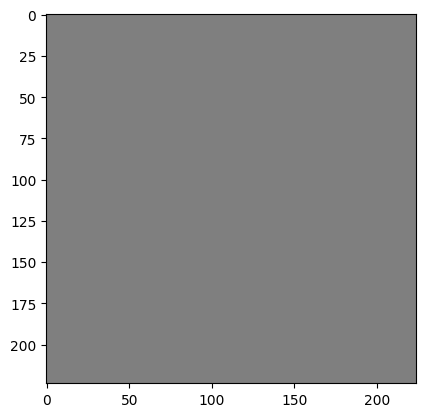

20 9.016512


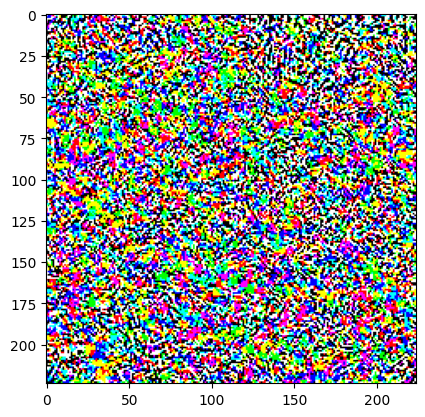

40 6.596743


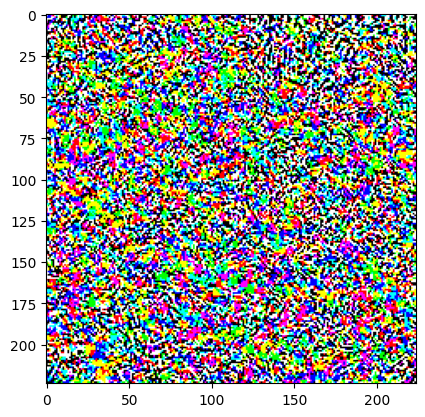

60 4.631979


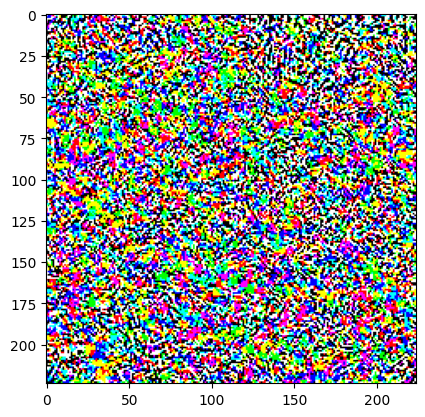

80 3.0220938


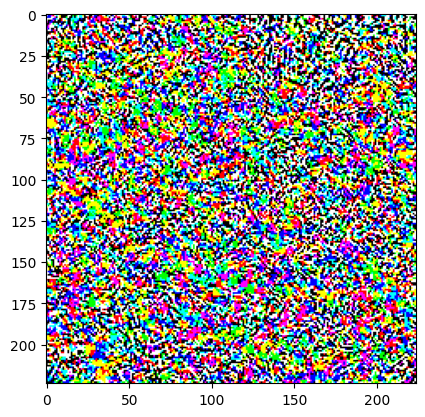

100 1.5800891


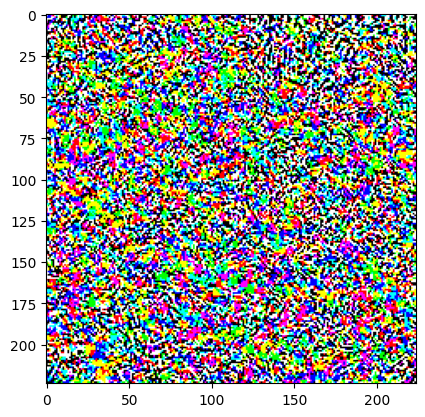

120 0.24796939


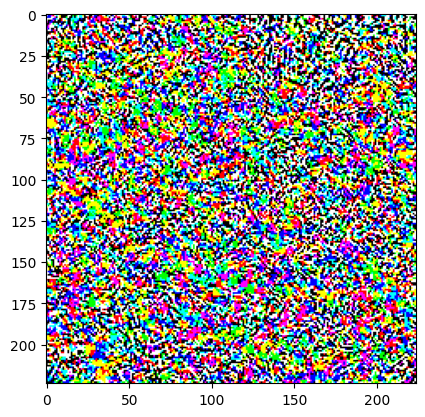

140 -1.0585567


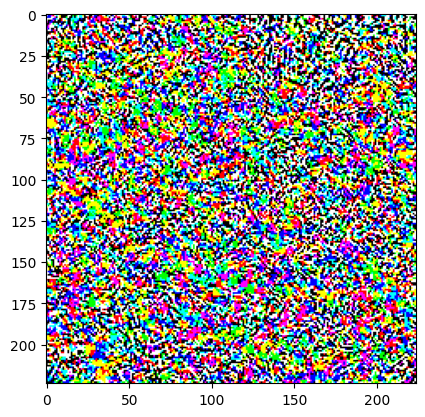

160 -2.2998104


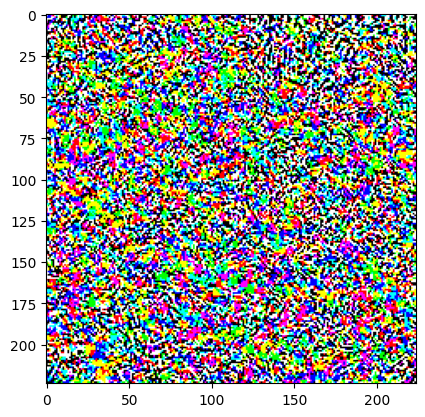

180 -3.5300908


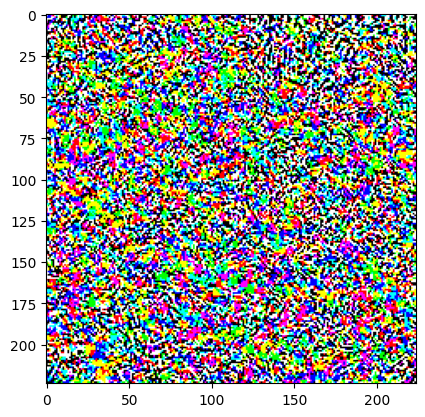

200 -4.774322


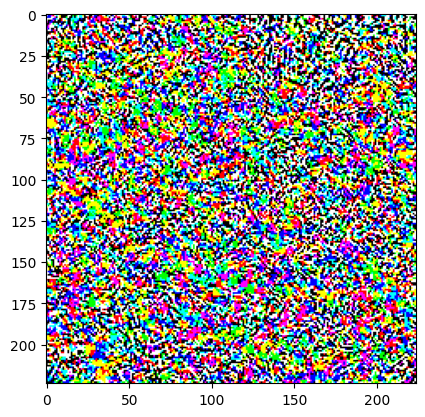

220 -6.1524105


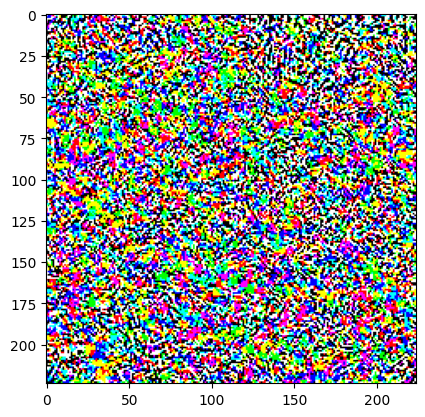

240 -7.62467


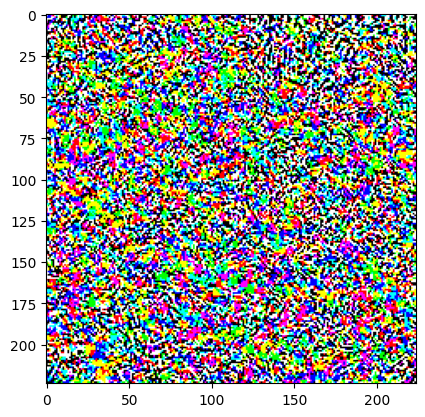

260 -9.111698


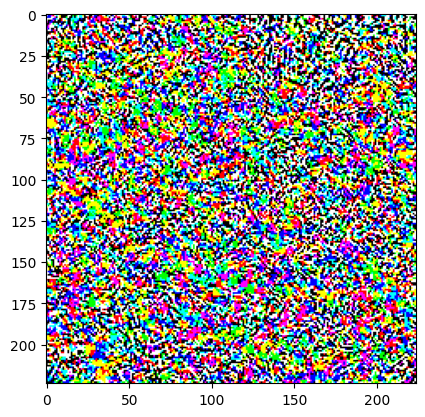

280 -10.649933


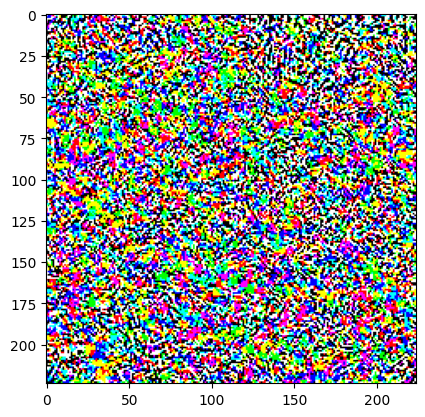

300 -12.342537


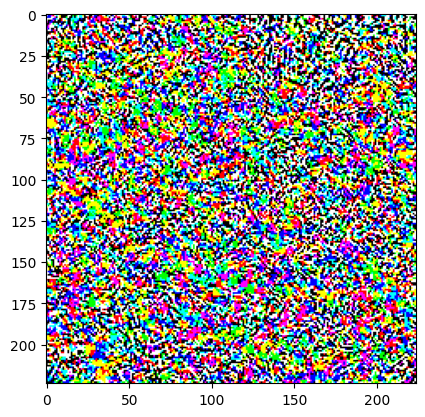

320 -14.246544


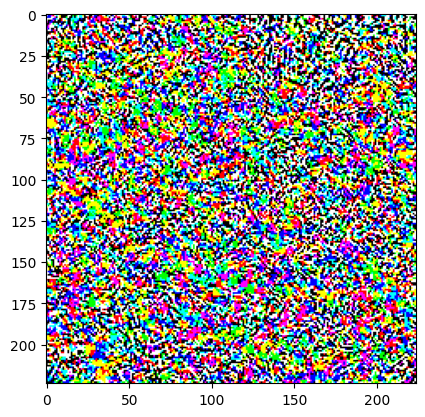

340 -16.297203


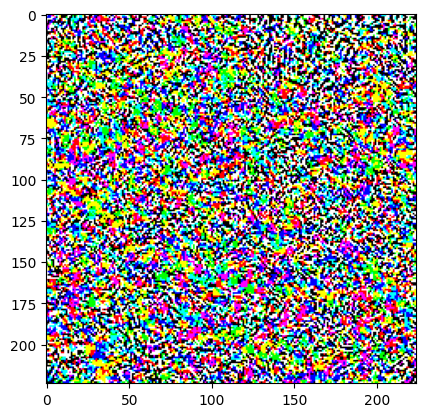

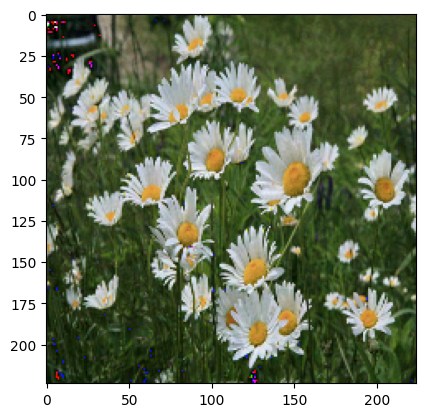

After adversarial attack
Predicted label: tulips


In [21]:
#@title EfficientNetB0 with ImageNet initialization
# Tulips class index 4
perturb_image(resnet50_flowers, sample_val_image, batch_labels[index].numpy(), 4)